In [42]:
%matplotlib inline

import IPython.display as ipd
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import MultiLabelBinarizer

import utils

sns.set_context("notebook", font_scale=1.5)
plt.rcParams['figure.figsize'] = (17, 5)

In [43]:
%matplotlib inline

import os

import IPython.display as ipd
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import sklearn as skl
import sklearn.utils, sklearn.preprocessing, sklearn.decomposition, sklearn.svm
import librosa
import librosa.display
import ast
from sklearn import svm

import utils

plt.rcParams['figure.figsize'] = (17, 5)

In [44]:
tracks = utils.load('data/fma_metadata/smalltracks.csv')
genres = utils.load('data/fma_metadata/smallgenres.csv')
features = utils.load('data/fma_metadata/smallfeatures.csv')
echonest = utils.load('data/fma_metadata/smallechonest.csv')
allgenres =  utils.load('data/fma_metadata/genres.csv')

np.testing.assert_array_equal(features.index, tracks.index)
assert echonest.index.isin(tracks.index).all()

tracks.shape, allgenres.shape, genres.shape, features.shape, echonest.shape

((8000, 53), (163, 4), (8, 4), (8000, 518), (1294, 249))

In [45]:
ipd.display(tracks['track'].head())
ipd.display(tracks['album'].head())
ipd.display(tracks['artist'].head())
ipd.display(tracks['set'].head())

,bit_rate,comments,composer,date_created,date_recorded,duration,favorites,genre_top,genres,genres_all,information,interest,language_code,license,listens,lyricist,number,publisher,tags,title
track_id,,,,,,,,,,,,,,,,,,,,
2,256000,0,NaN,2008-11-26 01:48:12,2008-11-26,168,2,Hip-Hop,[21],[21],NaN,4656,en,Attribution-NonCommercial-ShareAlike 3.0 Inter...,1293,NaN,3,NaN,[],Food
5,256000,0,NaN,2008-11-26 01:48:20,2008-11-26,206,6,Hip-Hop,[21],[21],NaN,1933,en,Attribution-NonCommercial-ShareAlike 3.0 Inter...,1151,NaN,6,NaN,[],This World
10,192000,0,Kurt Vile,2008-11-25 17:49:06,2008-11-26,161,178,Pop,[10],[10],NaN,54881,en,Attribution-NonCommercial-NoDerivatives (aka M...,50135,NaN,1,NaN,[],Freeway
140,128000,0,NaN,2008-11-26 01:44:07,2008-11-26,253,5,Folk,[17],[17],NaN,1593,en,Attribution-Noncommercial-No Derivative Works ...,1299,NaN,2,NaN,[],Queen Of The Wires
141,128000,0,NaN,2008-11-26 01:44:10,2008-11-26,182,1,Folk,[17],[17],NaN,839,en,Attribution-Noncommercial-No Derivative Works ...,725,NaN,4,NaN,[],Ohio


,comments,date_created,date_released,engineer,favorites,id,information,listens,producer,tags,title,tracks,type
track_id,,,,,,,,,,,,,
2,0,2008-11-26 01:44:45,2009-01-05,NaN,4,1,<p></p>,6073,NaN,[],AWOL - A Way Of Life,7,Album
5,0,2008-11-26 01:44:45,2009-01-05,NaN,4,1,<p></p>,6073,NaN,[],AWOL - A Way Of Life,7,Album
10,0,2008-11-26 01:45:08,2008-02-06,NaN,4,6,NaN,47632,NaN,[],Constant Hitmaker,2,Album
140,1,2008-11-26 01:49:59,2007-05-22,NaN,1,61,<p>Alec K. Redfearn &amp; The Eyesores: Ellen ...,1300,"Alec K. Refearn, Rob Pemberton",[],The Blind Spot,1,Album
141,0,2008-11-26 01:49:57,2009-01-16,NaN,1,60,"<p>A full ensamble of strings, drums, electron...",1304,NaN,[],Every Man For Himself,2,Album


,active_year_begin,active_year_end,associated_labels,bio,comments,date_created,favorites,id,latitude,location,longitude,members,name,related_projects,tags,website,wikipedia_page
track_id,,,,,,,,,,,,,,,,,
2,2006-01-01,NaT,NaN,"<p>A Way Of Life, A Collective of Hip-Hop from...",0,2008-11-26 01:42:32,9,1,40.058324,New Jersey,-74.405661,"Sajje Morocco,Brownbum,ZawidaGod,Custodian of ...",AWOL,The list of past projects is 2 long but every1...,[awol],http://www.AzillionRecords.blogspot.com,NaN
5,2006-01-01,NaT,NaN,"<p>A Way Of Life, A Collective of Hip-Hop from...",0,2008-11-26 01:42:32,9,1,40.058324,New Jersey,-74.405661,"Sajje Morocco,Brownbum,ZawidaGod,Custodian of ...",AWOL,The list of past projects is 2 long but every1...,[awol],http://www.AzillionRecords.blogspot.com,NaN
10,NaT,NaT,"Mexican Summer, Richie Records, Woodsist, Skul...","<p><span style=""font-family:Verdana, Geneva, A...",3,2008-11-26 01:42:55,74,6,NaN,NaN,NaN,"Kurt Vile, the Violators",Kurt Vile,NaN,"[philly, kurt vile]",http://kurtvile.com,NaN
140,1999-01-01,NaT,NaN,<p>The Eyesores originally formed in 1997 orig...,0,2008-11-26 01:47:44,11,54,41.823989,"Providence, RI",-71.412834,NaN,Alec K. Redfearn & the Eyesores,"Haldols, Amoebic Ensemble, Mr. Gutter",[alec k redfearn and the eyesores],http://www.aleckredfearn.com,http://en.wikipedia.org/wiki/Alec_K_Redfearn
141,1999-01-01,NaT,NaN,<p>The Eyesores originally formed in 1997 orig...,0,2008-11-26 01:47:44,11,54,41.823989,"Providence, RI",-71.412834,NaN,Alec K. Redfearn & the Eyesores,"Haldols, Amoebic Ensemble, Mr. Gutter",[alec k redfearn and the eyesores],http://www.aleckredfearn.com,http://en.wikipedia.org/wiki/Alec_K_Redfearn


,split,subset
track_id,,
2,training,small
5,training,small
10,training,small
140,training,small
141,training,small


In [47]:
print('{} tracks, {} artists, {} albums, {} genres'.format(
    len(tracks), len(tracks['artist', 'id'].unique()),
    len(tracks['album', 'id'].unique()),
    sum(genres['#tracks'] > 0)))
mean_duration = tracks['track', 'duration'].mean()
print('track duration: {:.0f} days total, {:.0f} seconds average'.format(
    sum(tracks['track', 'duration']) / 3600 / 24,
    mean_duration))

8000 tracks, 2309 artists, 2464 albums, 8 genres
track duration: 21 days total, 229 seconds average


In [48]:
dimensionality = mean_duration * 44000 * 2
print('sample dimensionality: {:.1e}'.format(dimensionality))
print('total size, i.e. number of audio samples: {:.1e}'.format(dimensionality * len(tracks)))

sample dimensionality: 2.0e+07
total size, i.e. number of audio samples: 1.6e+11


In [49]:
for subset in tracks['set', 'subset'].unique():
    indicator = tracks['set', 'subset'] <= subset
    print('{:6} {:6} tracks  {:.1f} days'.format(
        subset, sum(indicator), sum(indicator) * 30 / 3600 / 24))

small    8000 tracks  2.8 days


147066 deleted tracks (largest track_id is 155066)
First track: 2008-11-25 17:49:06


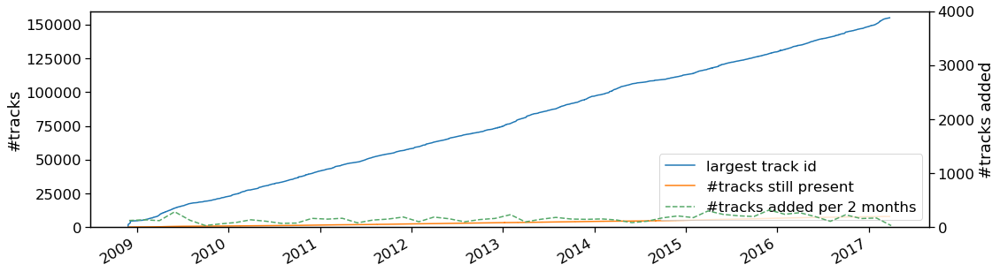

In [50]:
print('{} deleted tracks (largest track_id is {})'.format(tracks.index.max() - len(tracks), tracks.index.max()))
print('First track: {}'.format(tracks['track', 'date_created'].min()))

d = pd.DataFrame(tracks.index, index=tracks['track', 'date_created'].values)
d['indicator'] = 1

fig, ax1 = plt.subplots()
ax2 = ax1.twinx()

d['track_id'].plot(ax=ax1)
d['indicator'].cumsum().plot(ax=ax1)
ax1.set_ylabel('#tracks')
ax1.set_ylim(0, 160000)

(d['indicator'] * -100).plot(ax=ax2, style='r')  # needed for no apparent reason
color = sns.color_palette('deep', 3)[2]
d['indicator'].resample('2M').sum().fillna(0).plot(ax=ax2, style='--', color=color)
ax2.set_ylabel('#tracks added')
ax2.set_ylim(500, 4500)
ax2.set_ylim(0, 4000)
ax2.grid(False)

lns = ax1.get_lines() + [ax2.get_lines()[1]]
ax1.legend(lns, ['largest track id', '#tracks still present', '#tracks added per 2 months'], loc='lower right')

plt.savefig('figures/growth.pdf')

In [52]:
tracks['track', 'language_code'].value_counts().head(10)

en    928
es     21
ru      9
fr      9
de      6
bg      6
sw      5
el      5
pt      5
tr      4
Name: (track, language_code), dtype: int64

# Duration Display of Tracks

count    8000.000000
mean      228.841500
std        98.394854
min        60.000000
25%       161.000000
50%       215.000000
75%       279.000000
max       600.000000
Name: (track, duration), dtype: float64

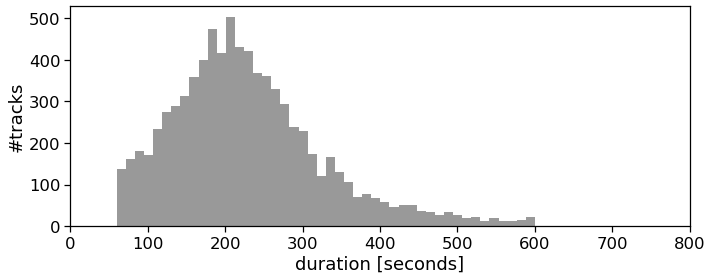

In [53]:
durations = tracks['track', 'duration']
plt.figure(figsize=(10, 4))  # Poster: (7, 3)
p = sns.distplot(durations[durations.values < 800], kde=False, rug=False, color='k', hist_kws=dict(alpha=0.4))
p.set_xlabel('duration [seconds]')
p.set_ylabel('#tracks')
p.set_xlim(0, 800)  # Poster: 500
plt.tight_layout()
plt.savefig('figures/duration_distribution.pdf')

durations.describe()

# Bit Rate

Common bit rates: [320000, 256000, 192000, 128000, 160000]
Average bit rate: 265 kbit/s


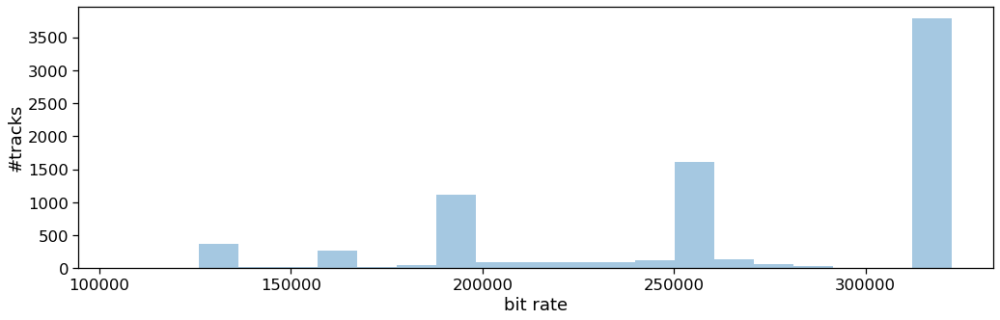

In [54]:
# Uncommon bit rates are VBR encodings.
print('Common bit rates: {}'.format(tracks['track', 'bit_rate'].value_counts().head(5).index.tolist()))
print('Average bit rate: {:.0f} kbit/s'.format(tracks['track', 'bit_rate'].mean()/1000))
p = sns.distplot(tracks['track', 'bit_rate'], kde=False, rug=False)
p.set_xlabel('bit rate')
p.set_ylabel('#tracks');

track: from 0 to 67 tags
album: from 0 to 67 tags
artist: from 0 to 55 tags


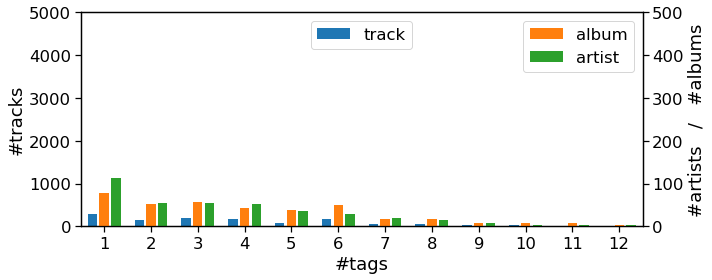

In [55]:
# Tags.
d1 = tracks['track', 'tags'].apply(len)
d2 = tracks.drop_duplicates(('album', 'id'))
d2 = d2['album', 'tags'].apply(len)
d3 = tracks.drop_duplicates(('artist', 'id'))
d3 = d3['artist', 'tags'].apply(len) - 1

labels = ['track', 'album', 'artist']
for l, d in zip(labels, [d1, d2, d3]):
    print('{}: from {} to {} tags'.format(l, max(d.min(), 0), d.max()))

MAX = 13  # Poster: 11
fig, ax1 = plt.subplots(figsize=(10, 4))  # Poster: (7, 3)
ax2 = ax1.twinx()

ax1.hist(d1, bins=np.arange(MAX)+0.25, rwidth=0.2, color='C0', label=labels[0])
ax2.hist(d2, bins=np.arange(MAX)+0.50, rwidth=0.2, color='C1', label=labels[1])
ax2.hist(d3, bins=np.arange(MAX)+0.75, rwidth=0.2, color='C2', label=labels[2])

ax1.set_xlabel('#tags')
ax1.set_ylabel('#tracks')
ax2.set_ylabel('#artists   /   #albums')
ax1.set_xlim(0.5, MAX-0.5)
ax1.set_xticks(range(1, MAX))
ax1.set_ylim(0, 5000)
ax2.set_ylim(0, 500)
ax1.legend(loc='upper center')
ax2.legend(loc='upper right')
ax2.grid(False)

fig.tight_layout()
fig.savefig('figures/tag_distribution.pdf')

In [56]:
# One artist tag is often the artist name.
col = 'artist'
d = tracks.drop_duplicates((col, 'id'))
d.loc[d[col, 'tags'].apply(len) > 0, [('artist', 'name'), (col, 'tags')]].head()

artist                                    
                                     name                                tags
track_id                                                                     
2                                    AWOL                              [awol]
10                              Kurt Vile                 [philly, kurt vile]
140       Alec K. Redfearn & the Eyesores  [alec k redfearn and the eyesores]
148                         Contradiction                     [contradiction]
182         Ariel Pink's Haunted Graffiti      [ariel pinks haunted graffiti]

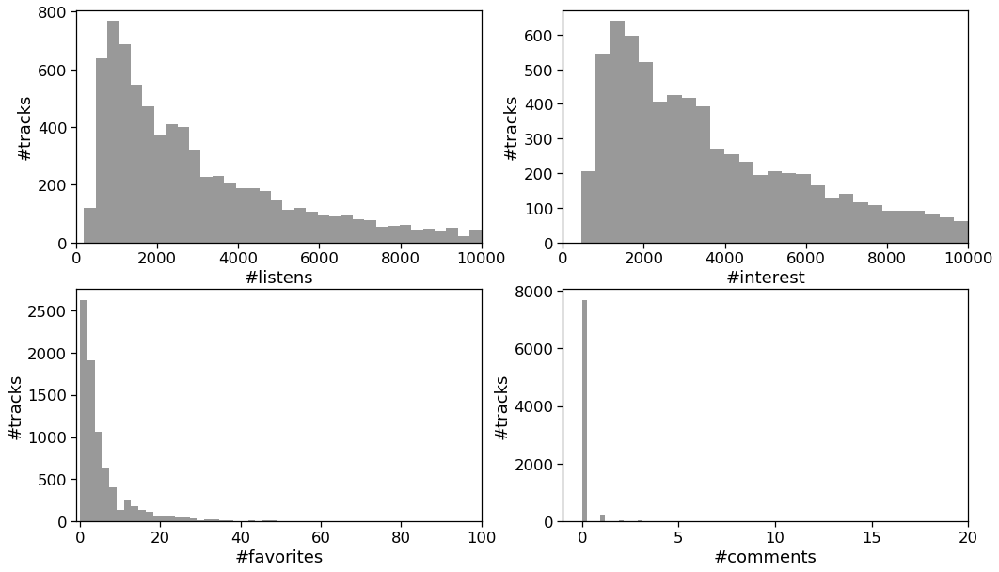

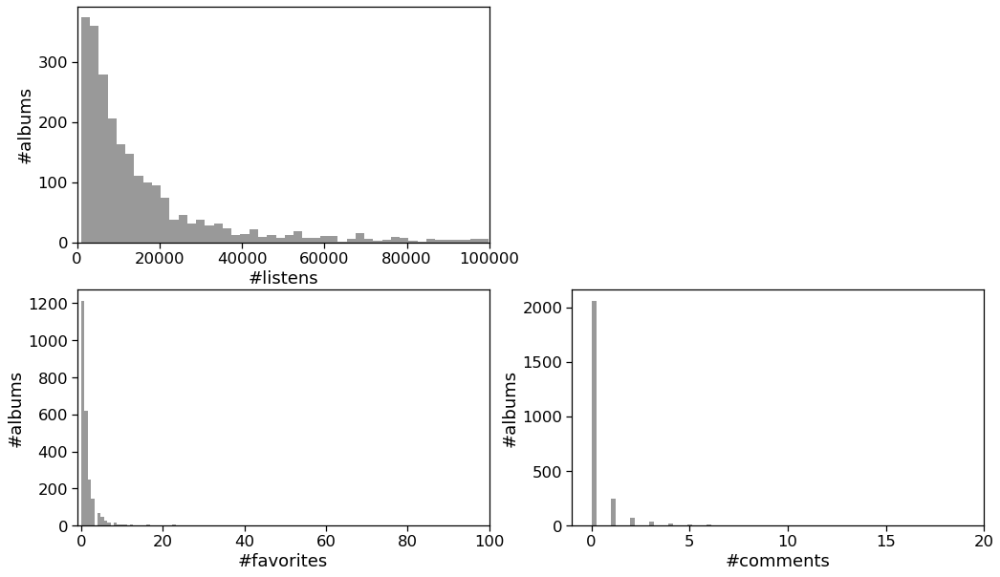

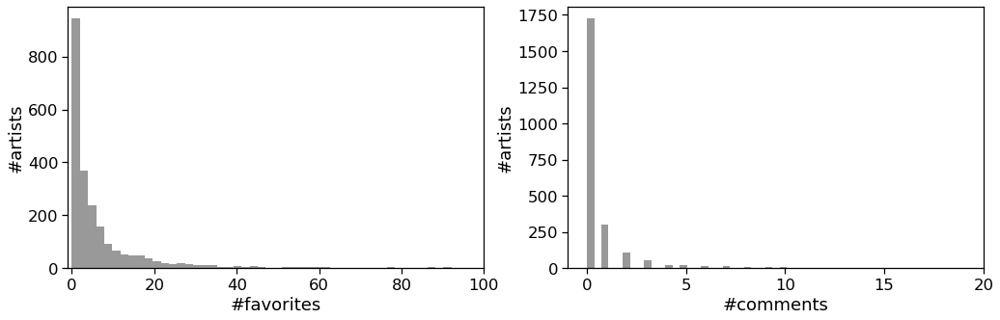

In [57]:
# Listens, favorites, comments.

def plot(col0, col1, maxval, subplot=None):
    if col0 == 'track':
        d = tracks['track']
    if col0 in ['artist', 'album']:
        d = tracks[col0].drop_duplicates('id')
    if subplot:
        plt.subplot(subplot)
    d = d[col1]
    p = sns.distplot(d[d.values < maxval], kde=False, color='k', hist_kws=dict(alpha=0.4))
    p.set_xlim(-1, maxval)
    p.set_xlabel('#' + col1)
    p.set_ylabel('#' + col0 + 's')

plt.figure(figsize=(17, 10))
plot('track', 'listens', 10e3, 221)
plot('track', 'interest', 10e3, 222)
plot('track', 'favorites', 100, 223)
plot('track', 'comments', 20, 224)

plt.figure(figsize=(17, 10))
plot('album', 'listens', 100e3, 221)
plot('album', 'favorites', 100, 223)
plot('album', 'comments', 20, 224)

plt.figure(figsize=(17, 5))
plot('artist', 'favorites', 100, 121)
plot('artist', 'comments', 20, 122)

674347

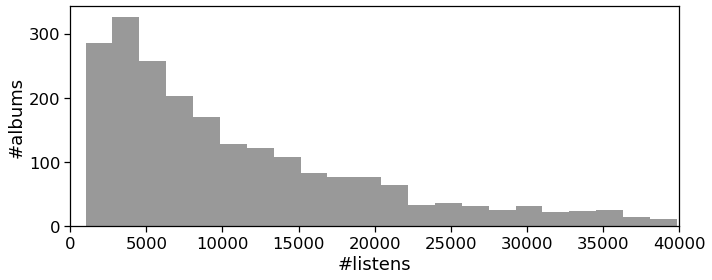

In [58]:
# Same as above, formated for the paper.
plt.figure(figsize=(10, 4))  # Poster: (7, 3)
plot('album', 'listens', 40e3)  # Poster 20e3
plt.tight_layout()
plt.savefig('figures/listens_distribution.pdf')

tracks['album', 'listens'].max()

In [59]:
# Most listened albums.
tracks['album'].groupby('id').first().sort_values('listens', ascending=False).head(10)

,comments,date_created,date_released,engineer,favorites,information,listens,producer,tags,title,tracks,type
id,,,,,,,,,,,,
8295,10,2011-01-18 12:03:35,2011-01-18,NaN,40,"<p>My newest and most cohesive work, 'Directio...",674347,NaN,"[trip hop, tracks to sync, stellar]",Directionless EP,6,Album
5347,0,2010-01-25 17:34:09,NaT,NaN,12,NaN,595875,NaN,[hip-hop],Free Beats Sel. 3,15,Album
11355,0,2012-03-25 14:15:12,NaT,NaN,15,<p>Traveller's Guide is a user guide. 14 songs...,586634,NaN,"[1intro, tracks to sync, betterwithmusic, pop,...",Traveller's Guide,9,Album
20183,6,2016-03-21 19:54:50,2016-03-22,NaN,28,"<p style=""margin:0px 0px 8px;padding:0px;font-...",468967,NaN,[],Music for TV & Film Vol. 1,42,Album
9620,2,2011-07-15 14:52:26,NaT,NaN,16,<p>Kevin MacLeod borrows from other cultures i...,431787,NaN,[],Global Sampler,9,Album
13915,1,2013-04-03 23:09:04,2013-04-09,NaN,7,<p>A collection of songs that may work as bed ...,386386,NaN,"[bed music, advertising, instrumental, undersc...",Background,35,Album
14588,6,2013-07-04 10:57:00,2013-07-07,NaN,2,<p><strong>C3S :: Ignition Mix</strong> marks ...,383201,NaN,"[country, classic rock, contemporary compositi...",C3S :: Ignition Mix,33,Album
13939,0,2013-04-04 03:47:12,2013-04-30,NaN,7,<p>This collection features compositions that ...,377713,NaN,[],Tender,25,Album
13923,2,2013-04-04 00:01:23,NaT,NaN,9,"<p>A collection of uplifting, percolating, and...",355006,NaN,[],Inspiring,15,Album


# Dates

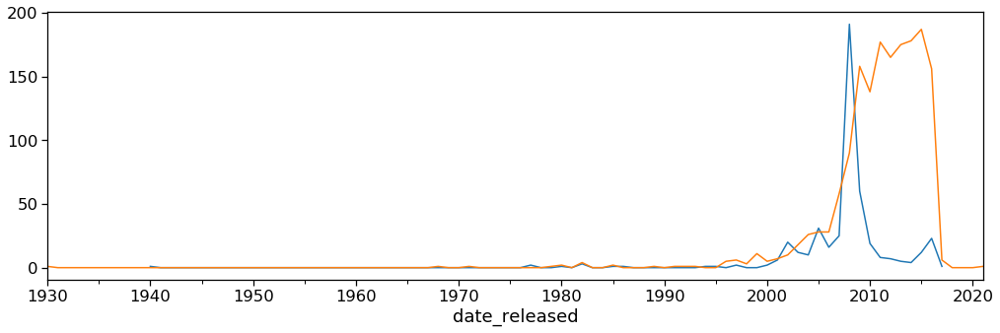

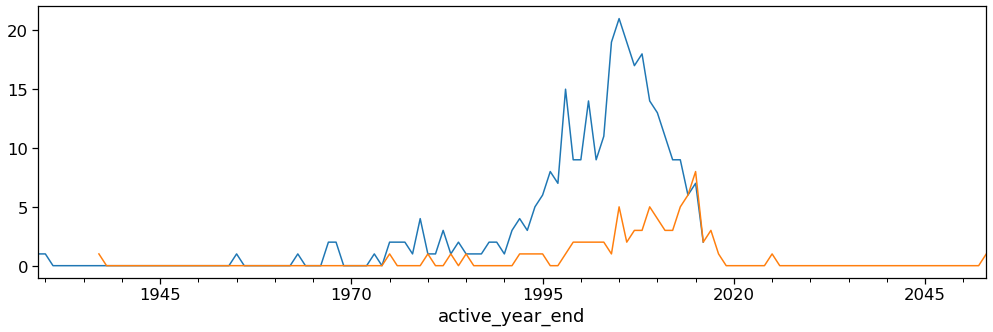

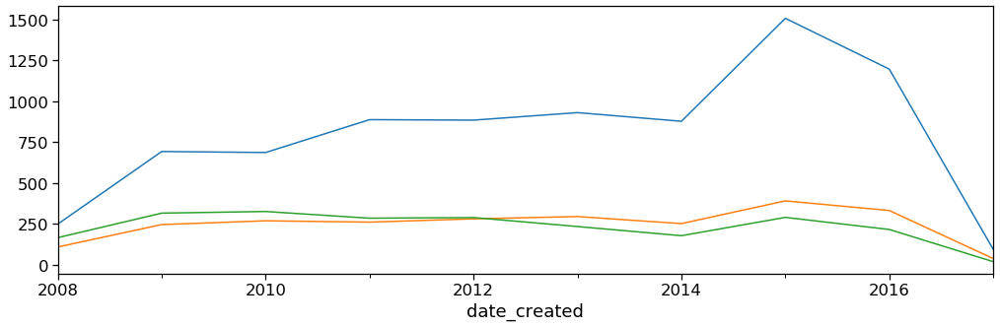

In [60]:
def plot(col0, col1):
    if col0 == 'track':
        d = tracks['track']
    if col0 in ['artist', 'album']:
        d = tracks[col0].drop_duplicates('id')
    d = pd.Series(1, index=d[col1])
    d.resample('A').sum().fillna(0).plot()

plt.figure()
plot('track', 'date_recorded')
plot('album', 'date_released')

plt.figure()
plot('artist', 'active_year_begin')
plot('artist', 'active_year_end')

plt.figure()
plot('track', 'date_created')
plot('album', 'date_created')
plot('artist', 'date_created')

(1930, 2021)

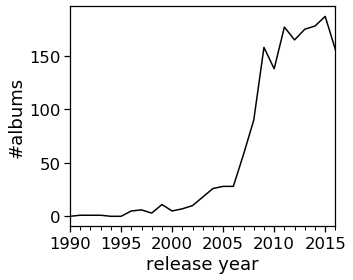

In [61]:
# Same as above, formated for the paper.
plt.figure(figsize=(5, 4))
d = tracks['album'].drop_duplicates('id')
d = pd.Series(1, index=d['date_released'])
d = d.resample('A').sum().fillna(0)
b = d.index >= pd.to_datetime(1990, format='%Y')
b &= d.index <= pd.to_datetime(2017, format='%Y')
d[b].plot(color='k')
plt.xlabel('release year')
plt.ylabel('#albums')
plt.tight_layout()
plt.savefig('figures/album_release_year.pdf')

d.index.min().year, d.index.max().year

# ARtist and albume effect

19461    208
77        91
16031     68
19472     56
12271     55
Name: (artist, id), dtype: int64

18328    36
2898     33
7762     29
17220    28
17457    25
Name: (album, id), dtype: int64

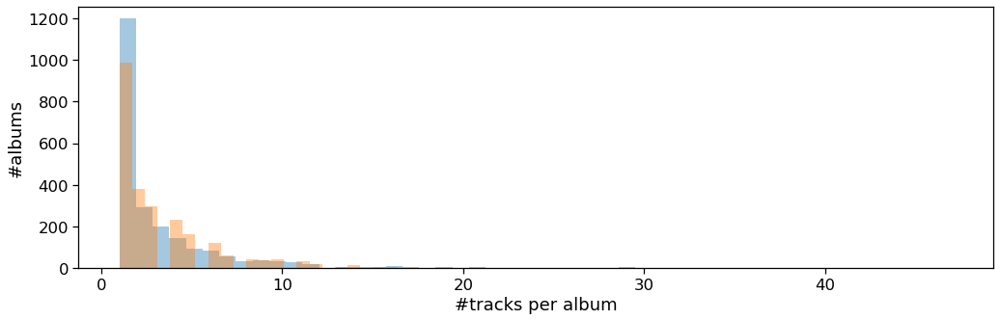

In [62]:
for effect in ['artist', 'album']:
    d = tracks[effect, 'id'].value_counts()
    ipd.display(d.head(5))
    p = sns.distplot(d[(d.values < 50) & (d.values >= 0)], kde=False)
    p.set_xlabel('#tracks per ' + effect);
    p.set_ylabel('#' + effect + 's');

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/ipykernel_launcher.py:1: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  """Entry point for launching an IPython kernel.


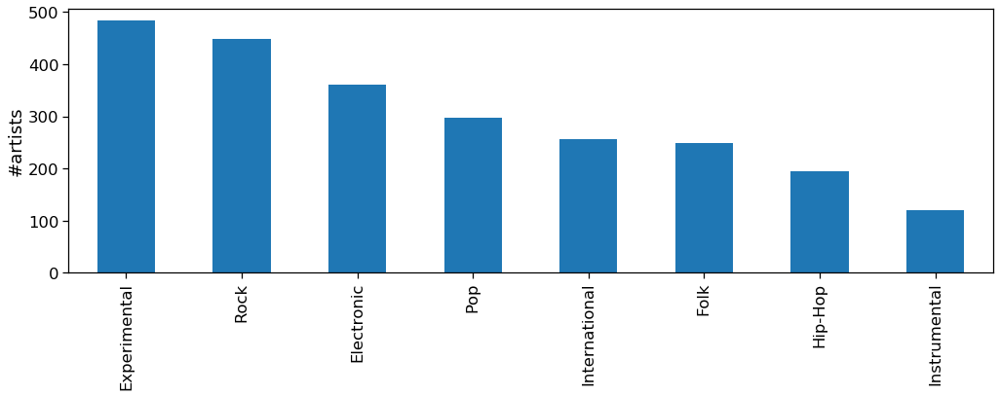

In [63]:
counts = pd.Series(index=genres.loc[genres['parent'] == 0, 'title'].values, name='#artists')
for genre in counts.index:
    counts[genre] = len(tracks.loc[tracks['track', 'genre_top'] == genre, ('artist', 'id')].unique())
counts.sort_values(ascending=False).plot.bar()
plt.ylabel('#artists');

# Genre Exploration

In [64]:
a = set(tracks['track', 'genre_top'].unique().dropna())
b = set(genres.loc[genres['top_level'].unique(), 'title'].values)
assert a == b

print('{} top-level genres'.format(len(a)))
genres[genres['parent'] == 0].sort_values('#tracks', ascending=False)

8 top-level genres


,#tracks,parent,title,top_level
genre_id,,,,
38,38154,0,Experimental,38
15,34413,0,Electronic,15
12,32923,0,Rock,12
1235,14938,0,Instrumental,1235
10,13845,0,Pop,10
17,12706,0,Folk,17
21,8389,0,Hip-Hop,21
2,5271,0,International,2


genres
max: 6 per track: from 1 to 6 tags
genres_all
max: 8 per track: from 1 to 8 tags
#tracks without genre: 0


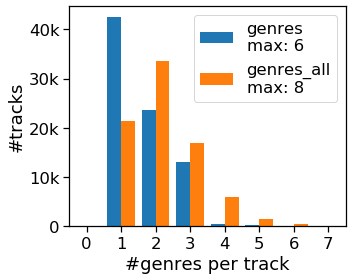

In [65]:
# Genres per track.
labels = ['genres', 'genres_all']  #, 'genres_top']
d = [tracks['track', label].map(len) for label in labels]
labels = ['{}\nmax: {}'.format(label, d1.max()) for label, d1 in zip(labels, d)]

for l, d1 in zip(labels, d):
    print('{} per track: from {} to {} tags'.format(l, d1.min(), d1.max()))
print('#tracks without genre: {}'.format((tracks['track', 'genres'].map(len) == 0).sum()))

MAX = 9
fig, ax = plt.subplots(figsize=(5, 4))
ax.hist(d, bins=np.arange(MAX)-0.5, label=labels)
ax.set_xlabel('#genres per track')
ax.set_ylabel('#tracks')
ax.set_xlim(-0.5, MAX-1.5)
ax.set_xticks(range(MAX-1))
ax.set_yticklabels(['0'] + ['{}0k'.format(i) for i in range(1, 6)])
ax.legend(loc='upper right')
fig.tight_layout()
fig.savefig('figures/genres_per_track.pdf')

# Number of tracks per genre (full).


(5271, 38154)

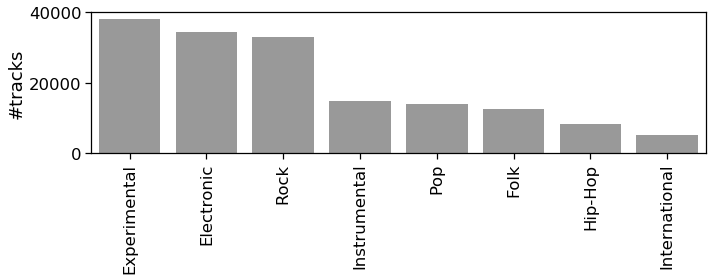

In [66]:
d = genres[genres['#tracks'] > 2000].sort_values('#tracks', ascending=False)  # Poster: 5000
plt.figure(figsize=(10, 4))  # Poster: (7, 4)
p = sns.barplot('title', '#tracks', data=d, color='k', alpha=0.4)
p.set_xlabel('')
p.set_ylabel('#tracks')
plt.xticks(rotation=90)
plt.tight_layout()
plt.savefig('figures/genre_distribution.pdf')

genres.loc[genres['#tracks'] > 0, '#tracks'].min(), genres['#tracks'].max()

In [67]:
graph = g.create_tree(14)
graph.write_pdf('figures/genre_hierarchy.pdf');

roots = g.find_roots()
print('{} roots'.format(len(roots)))
graph = g.create_tree(roots)
graph.write_pdf('figures/genre_hierarchy.pdf');

KeyError: 14

In [ ]:
g = utils.Genres(genres)
graph = g.create_tree([25a, 31], 1)
ipd.Image(graph.create_png())

# Genres

In [68]:
print('{} top-level genres'.format(len(genres['top_level'].unique())))
genres.loc[genres['top_level'].unique()].sort_values('#tracks', ascending=False)

8 top-level genres


,#tracks,parent,title,top_level
genre_id,,,,
38,38154,0,Experimental,38
15,34413,0,Electronic,15
12,32923,0,Rock,12
1235,14938,0,Instrumental,1235
10,13845,0,Pop,10
17,12706,0,Folk,17
21,8389,0,Hip-Hop,21
2,5271,0,International,2


# Features

In [69]:
print('{1} features for {0} tracks'.format(*features.shape))
columns = ['mfcc', 'chroma_cens', 'tonnetz', 'spectral_contrast']
columns.append(['spectral_centroid', 'spectral_bandwidth', 'spectral_rolloff'])
columns.append(['rmse', 'zcr'])
for column in columns:
    ipd.display(features[column].head().style.format('{:.2f}'))

518 features for 8000 tracks


#Echonest FEatures

In [72]:
print('{1} features for {0} tracks'.format(*echonest.shape))
ipd.display(echonest['echonest', 'metadata'].head())
ipd.display(echonest['echonest', 'audio_features'].head())
ipd.display(echonest['echonest', 'social_features'].head())
ipd.display(echonest['echonest', 'ranks'].head())

249 features for 1294 tracks


,album_date,album_name,artist_latitude,artist_location,artist_longitude,artist_name,release
track_id,,,,,,,
2,NaN,NaN,32.6783,"Georgia, US",-83.2230,AWOL,AWOL - A Way Of Life
5,NaN,NaN,32.6783,"Georgia, US",-83.2230,AWOL,AWOL - A Way Of Life
10,2008-03-11,Constant Hitmaker,39.9523,"Philadelphia, PA, US",-75.1624,Kurt Vile,Constant Hitmaker
140,NaN,NaN,41.8239,"Providence, RI, US",-71.4120,Alec K. Redfearn and the Eyesores,The Blind Spot
141,NaN,NaN,41.8239,"Providence, RI, US",-71.4120,Alec K. Redfearn and the Eyesores,Every Man For Himself


,acousticness,danceability,energy,instrumentalness,liveness,speechiness,tempo,valence
track_id,,,,,,,,
2,0.416675,0.675894,0.634476,0.010628,0.177647,0.159310,165.922,0.576661
5,0.043567,0.745566,0.701470,0.000697,0.373143,0.124595,100.260,0.621661
10,0.951670,0.658179,0.924525,0.965427,0.115474,0.032985,111.562,0.963590
140,0.376312,0.734079,0.265685,0.669581,0.085995,0.039068,107.952,0.609991
141,0.963657,0.435933,0.075632,0.345493,0.105686,0.026658,33.477,0.163950


,artist_discovery,artist_familiarity,artist_hotttnesss,song_currency,song_hotttnesss
track_id,,,,,
2,0.388990,0.386740,0.406370,0.000000,0.000000
5,0.388990,0.386740,0.406370,0.000000,0.000000
10,0.557339,0.614272,0.798387,0.005158,0.354516
140,0.388923,0.330784,0.406300,0.000000,0.000000
141,0.388923,0.330784,0.406300,0.000167,0.038550


,artist_discovery_rank,artist_familiarity_rank,artist_hotttnesss_rank,song_currency_rank,song_hotttnesss_rank
track_id,,,,,
2,NaN,NaN,NaN,NaN,NaN
5,NaN,NaN,NaN,NaN,NaN
10,2635.0,2544.0,397.0,115691.0,67609.0
140,149495.0,104037.0,159249.0,NaN,NaN
141,NaN,NaN,NaN,NaN,NaN


,000,001,002,003,004,005,006,007,008,009,...,214,215,216,217,218,219,220,221,222,223
track_id,,,,,,,,,,,,,,,,,,,,,
2,0.877233,0.588911,0.354243,0.295090,0.298413,0.309430,0.304496,0.334579,0.249495,0.259656,...,-1.992303,6.805694,0.233070,0.19288,0.027455,0.06408,3.67696,3.61288,13.316690,262.929749
5,0.548093,0.720192,0.389257,0.344934,0.361300,0.402543,0.434044,0.388137,0.512487,0.525755,...,-2.288358,11.527109,0.256821,0.23782,0.060122,0.06014,5.92649,5.86635,16.013849,356.755737
10,0.311404,0.711402,0.321914,0.500601,0.250963,0.321316,0.734250,0.325188,0.373012,0.235840,...,-3.662988,21.508228,0.283352,0.26707,0.125704,0.08082,8.41401,8.33319,21.317064,483.403809
140,0.331811,0.312733,0.465402,0.248236,0.354816,0.402958,0.243551,0.279638,0.233957,0.381421,...,-0.934696,-0.260981,0.322232,0.27798,0.136747,0.07533,9.86272,9.78739,21.981621,562.229431
141,0.255494,0.185218,0.244429,0.265849,0.240221,0.400698,0.215055,0.266616,0.161271,0.338353,...,-0.457298,-0.165962,0.437503,0.30739,0.368764,0.06263,11.18884,11.12621,13.481531,232.993546


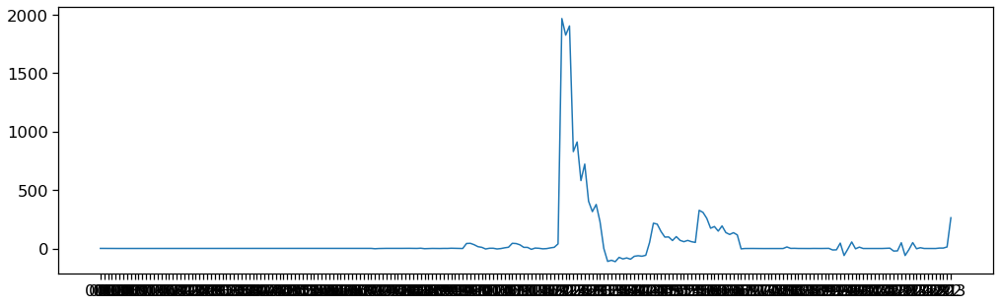

In [73]:
ipd.display(echonest['echonest', 'temporal_features'].head())
x = echonest.loc[2, ('echonest', 'temporal_features')]
plt.plot(x);

((2000, 2), (2000,))

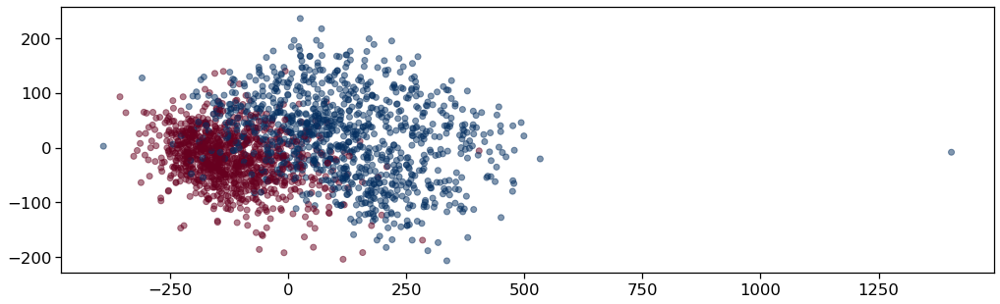

In [75]:
genre1 = tracks['track', 'genre_top'] == 'Instrumental'
genre2 = tracks['track', 'genre_top'] == 'Hip-Hop'

X = features.loc[(genre1 | genre2), 'mfcc']
X = skl.decomposition.PCA(n_components=2).fit_transform(X)

y = tracks.loc[(genre1 | genre2), ('track', 'genre_top')]
y = skl.preprocessing.LabelEncoder().fit_transform(y)

plt.scatter(X[:,0], X[:,1], c=y, cmap='RdBu', alpha=0.5)
X.shape, y.shape

# Compare Spectogram from 8 different Genres

In [84]:
tracks['track','genre_top'].value_counts()

Rock             1000
Pop              1000
International    1000
Instrumental     1000
Hip-Hop          1000
Folk             1000
Experimental     1000
Electronic       1000
Name: (track, genre_top), dtype: int64

### Rock

In [142]:
tracks.loc[tracks['track','genre_top']=='Rock'].head(1)

album                                                           \
         comments        date_created date_released engineer favorites  id   
track_id                                                                     
182             0 2008-11-26 01:52:18    2005-04-26      NaN         0  80   

                                                                              \
                                                information listens producer   
track_id                                                                       
182       <p><em>Worn Copy</em> is    the history of pop...    5289      NaN   

               ...    track                \
         tags  ... interest language_code   
track_id       ...                          
182        []  ...     5990            en   

                                                                              \
                                                    license listens lyricist   
track_id                                                                       
182       Attribution-Noncommercial-No Derivative Works ...    5547      NaN   

                                                                   subset  
         number publisher tags                  title Unnamed: 53_level_1  
track_id                                                                   
182           3       NaN   []  Jules Lost His Jewels               small  

[1 rows x 53 columns]

In [176]:
filename = 'data/fma_audio/000/000182.mp3'
x, sr = librosa.load(filename, sr=None, mono=True)
start, end = 0, 10
ipd.Audio(data=x[start*sr:end*sr], rate=sr)



/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/librosa/core/audio.py:162: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn("PySoundFile failed. Trying audioread instead.")


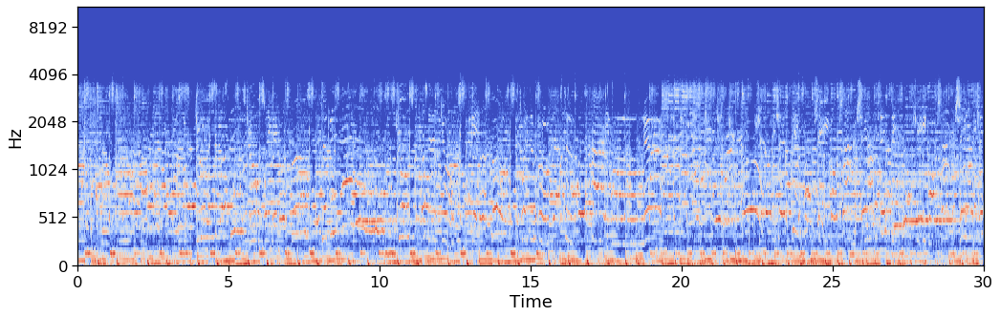

In [177]:
stft = np.abs(librosa.stft(x, n_fft=2048, hop_length=512))
mel = librosa.feature.melspectrogram(sr=sr, S=stft**2)
log_mel = librosa.amplitude_to_db(mel)
librosa.display.specshow(log_mel, sr=sr, hop_length=512, x_axis='time', y_axis='mel');

### Pop

In [146]:
tracks.loc[tracks['track','genre_top']=='Pop'].head(1)

album                                                          \
         comments        date_created date_released engineer favorites id   
track_id                                                                    
10              0 2008-11-26 01:45:08    2008-02-06      NaN         4  6   

                                            ...    track                \
         information listens producer tags  ... interest language_code   
track_id                                    ...                          
10               NaN   47632      NaN   []  ...    54881            en   

                                                                              \
                                                    license listens lyricist   
track_id                                                                       
10        Attribution-NonCommercial-NoDerivatives (aka M...   50135      NaN   

                                                     subset  
         number publisher tags    title Unnamed: 53_level_1  
track_id                                                     
10            1       NaN   []  Freeway               small  

[1 rows x 53 columns]

In [178]:
filename = 'data/fma_audio/000/000010.mp3'
x, sr = librosa.load(filename, sr=None, mono=True)
start, end = 0, 10
ipd.Audio(data=x[start*sr:end*sr], rate=sr)


/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/librosa/core/audio.py:162: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn("PySoundFile failed. Trying audioread instead.")


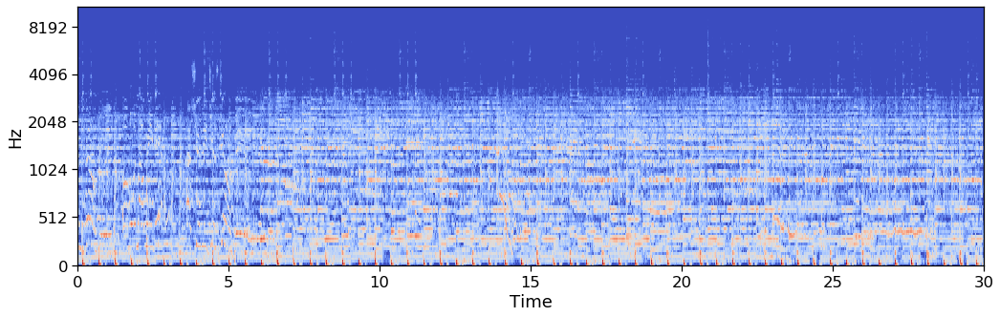

In [179]:
stft = np.abs(librosa.stft(x, n_fft=2048, hop_length=512))
mel = librosa.feature.melspectrogram(sr=sr, S=stft**2)
log_mel = librosa.amplitude_to_db(mel)
librosa.display.specshow(log_mel, sr=sr, hop_length=512, x_axis='time', y_axis='mel');

### Instrumental 

In [149]:
tracks.loc[tracks['track','genre_top']=='Instrumental'].head(1)

album                                                             \
         comments        date_created date_released engineer favorites    id   
track_id                                                                       
10250           0 2009-04-09 07:19:43           NaT      NaN         0  2524   

                                            ...    track                \
         information listens producer tags  ... interest language_code   
track_id                                    ...                          
10250            NaN   16695      NaN   []  ...     7400            en   

                                                                              \
                                                    license listens lyricist   
track_id                                                                       
10250     Attribution-Noncommercial-No Derivative Works ...    6577      NaN   

                                                           subset  
         number publisher tags          title Unnamed: 53_level_1  
track_id                                                           
10250         0       NaN   []  Tree Symphony               small  

[1 rows x 53 columns]

In [180]:
filename = 'data/fma_audio/010/010250.mp3'
x, sr = librosa.load(filename, sr=None, mono=True)
start, end = 0,10
ipd.Audio(data=x[start*sr:end*sr], rate=sr)


/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/librosa/core/audio.py:162: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn("PySoundFile failed. Trying audioread instead.")


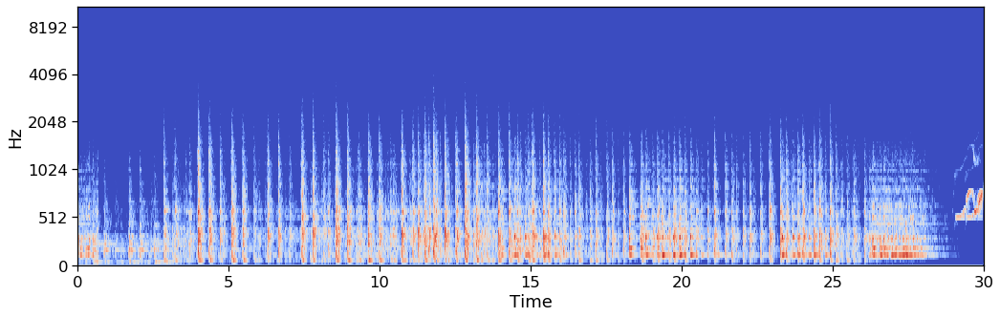

In [181]:
stft = np.abs(librosa.stft(x, n_fft=2048, hop_length=512))
mel = librosa.feature.melspectrogram(sr=sr, S=stft**2)
log_mel = librosa.amplitude_to_db(mel)
librosa.display.specshow(log_mel, sr=sr, hop_length=512, x_axis='time', y_axis='mel');

### International

In [152]:
tracks.loc[tracks['track','genre_top']=='International'].head(1)

album                                                            \
         comments        date_created date_released engineer favorites   id   
track_id                                                                      
666             0 2008-11-26 02:14:43    2009-01-08      NaN         1  189   

                                                                              \
                                                information listens producer   
track_id                                                                       
666       <p>2 unreleased mp3s from Portland, OR's all-f...    3883      NaN   

               ...    track                \
         tags  ... interest language_code   
track_id       ...                          
666        []  ...     2614            en   

                                                                              \
                                                    license listens lyricist   
track_id                                                                       
666       Attribution-NonCommercial-ShareAlike 3.0 Inter...    1902      NaN   

                                                  subset  
         number publisher tags title Unnamed: 53_level_1  
track_id                                                  
666           0       NaN   []  Heat               small  

[1 rows x 53 columns]

In [182]:
filename = 'data/fma_audio/000/000666.mp3'
x, sr = librosa.load(filename, sr=None, mono=True)
start, end = 0, 10
ipd.Audio(data=x[start*sr:end*sr], rate=sr)


/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/librosa/core/audio.py:162: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn("PySoundFile failed. Trying audioread instead.")


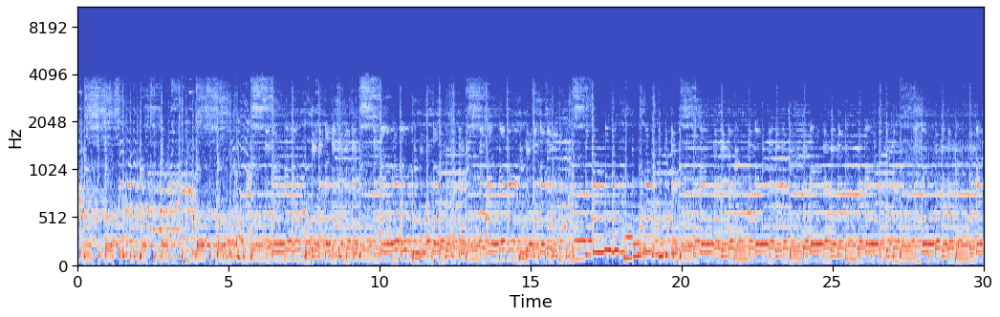

In [183]:
stft = np.abs(librosa.stft(x, n_fft=2048, hop_length=512))
mel = librosa.feature.melspectrogram(sr=sr, S=stft**2)
log_mel = librosa.amplitude_to_db(mel)
librosa.display.specshow(log_mel, sr=sr, hop_length=512, x_axis='time', y_axis='mel');

### Hip-Hop

In [159]:
tracks.loc[tracks['track','genre_top']=='Hip-Hop'].head(1)

album                                                          \
         comments        date_created date_released engineer favorites id   
track_id                                                                    
2               0 2008-11-26 01:44:45    2009-01-05      NaN         4  1   

                                            ...    track                \
         information listens producer tags  ... interest language_code   
track_id                                    ...                          
2            <p></p>    6073      NaN   []  ...     4656            en   

                                                                              \
                                                    license listens lyricist   
track_id                                                                       
2         Attribution-NonCommercial-ShareAlike 3.0 Inter...    1293      NaN   

                                                  subset  
         number publisher tags title Unnamed: 53_level_1  
track_id                                                  
2             3       NaN   []  Food               small  

[1 rows x 53 columns]

In [184]:
filename = 'data/fma_audio/000/000002.mp3'
x, sr = librosa.load(filename, sr=None, mono=True)
start, end = 0, 10
ipd.Audio(data=x[start*sr:end*sr], rate=sr)


/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/librosa/core/audio.py:162: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn("PySoundFile failed. Trying audioread instead.")


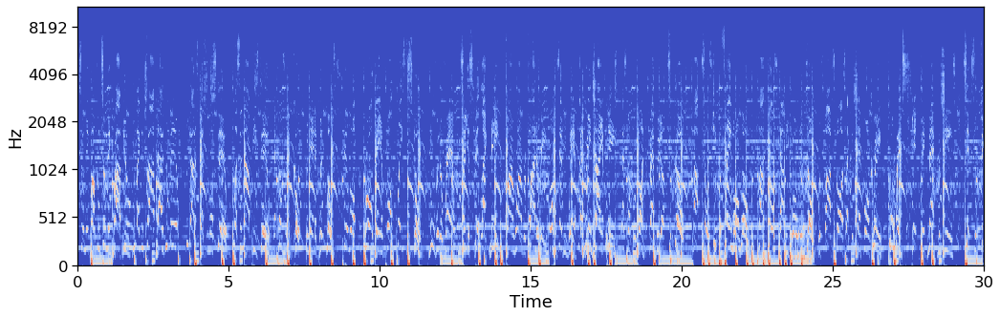

In [185]:
stft = np.abs(librosa.stft(x, n_fft=2048, hop_length=512))
mel = librosa.feature.melspectrogram(sr=sr, S=stft**2)
log_mel = librosa.amplitude_to_db(mel)
librosa.display.specshow(log_mel, sr=sr, hop_length=512, x_axis='time', y_axis='mel');

### Folk

In [162]:
tracks.loc[tracks['track','genre_top']=='Folk'].head(1)

album                                                           \
         comments        date_created date_released engineer favorites  id   
track_id                                                                     
140             1 2008-11-26 01:49:59    2007-05-22      NaN         1  61   

                                                                     \
                                                information listens   
track_id                                                              
140       <p>Alec K. Redfearn &amp; The Eyesores: Ellen ...    1300   

                                               ...    track                \
                                producer tags  ... interest language_code   
track_id                                       ...                          
140       Alec K. Refearn, Rob Pemberton   []  ...     1593            en   

                                                                              \
                                                    license listens lyricist   
track_id                                                                       
140       Attribution-Noncommercial-No Derivative Works ...    1299      NaN   

                                                                subset  
         number publisher tags               title Unnamed: 53_level_1  
track_id                                                                
140           2       NaN   []  Queen Of The Wires               small  

[1 rows x 53 columns]

In [186]:
filename = 'data/fma_audio/000/000140.mp3'
x, sr = librosa.load(filename, sr=None, mono=True)
start, end = 0, 10
ipd.Audio(data=x[start*sr:end*sr], rate=sr)


/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/librosa/core/audio.py:162: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn("PySoundFile failed. Trying audioread instead.")


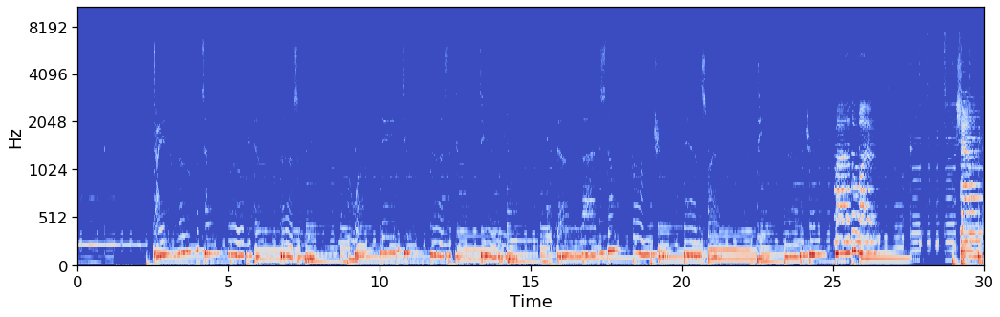

In [187]:
stft = np.abs(librosa.stft(x, n_fft=2048, hop_length=512))
mel = librosa.feature.melspectrogram(sr=sr, S=stft**2)
log_mel = librosa.amplitude_to_db(mel)
librosa.display.specshow(log_mel, sr=sr, hop_length=512, x_axis='time', y_axis='mel');

### Experimental

In [165]:
tracks.loc[tracks['track','genre_top']=='Experimental'].head(1)

album                                                           \
         comments        date_created date_released engineer favorites  id   
track_id                                                                     
148             0 2008-11-26 01:50:19    2009-01-15      NaN         0  66   

                                                                              \
                                                information listens producer   
track_id                                                                       
148       <p>"Compositions for electronics and voice." I...    1831      NaN   

               ...    track                \
         tags  ... interest language_code   
track_id       ...                          
148        []  ...     2437            en   

                                                                              \
                                                    license listens lyricist   
track_id                                                                       
148       Attribution-Noncommercial-Share Alike 3.0 Unit...    1831      NaN   

                                                        subset  
         number publisher tags       title Unnamed: 53_level_1  
track_id                                                        
148           2       NaN   []  Blackout 2               small  

[1 rows x 53 columns]

In [188]:
filename = 'data/fma_audio/000/000148.mp3'
x, sr = librosa.load(filename, sr=None, mono=True)
start, end = 0, 10
ipd.Audio(data=x[start*sr:end*sr], rate=sr)


/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/librosa/core/audio.py:162: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn("PySoundFile failed. Trying audioread instead.")


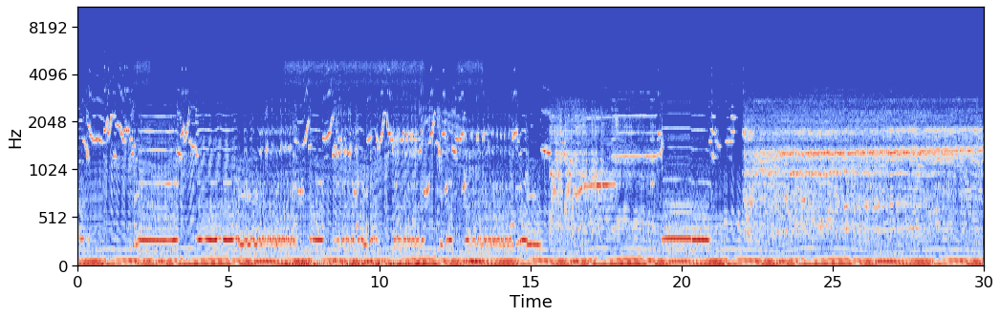

In [189]:
stft = np.abs(librosa.stft(x, n_fft=2048, hop_length=512))
mel = librosa.feature.melspectrogram(sr=sr, S=stft**2)
log_mel = librosa.amplitude_to_db(mel)
librosa.display.specshow(log_mel, sr=sr, hop_length=512, x_axis='time', y_axis='mel');

### Electronic

In [169]:
tracks.loc[tracks['track','genre_top']=='Electronic'].head(1)

album                                                            \
         comments        date_created date_released engineer favorites   id   
track_id                                                                      
1482            0 2008-11-26 02:58:24    2009-01-16      NaN         0  389   

                                                                              \
                                                information listens producer   
track_id                                                                       
1482      <p>Self-released tape recorded Alfred, NY and ...   61609      NaN   

               ...    track                \
         tags  ... interest language_code   
track_id       ...                          
1482       []  ...    93276            en   

                                                                              \
                                                    license listens lyricist   
track_id                                                                       
1482      Attribution-Noncommercial-Share Alike 3.0 Unit...   77299      NaN   

                                                            subset  
         number publisher tags           title Unnamed: 53_level_1  
track_id                                                            
1482          2       NaN   []  Reindeer Dance               small  

[1 rows x 53 columns]

In [190]:
filename = 'data/fma_audio/001/001482.mp3'
x, sr = librosa.load(filename, sr=None, mono=True)
start, end = 0, 10
ipd.Audio(data=x[start*sr:end*sr], rate=sr)


/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/librosa/core/audio.py:162: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn("PySoundFile failed. Trying audioread instead.")


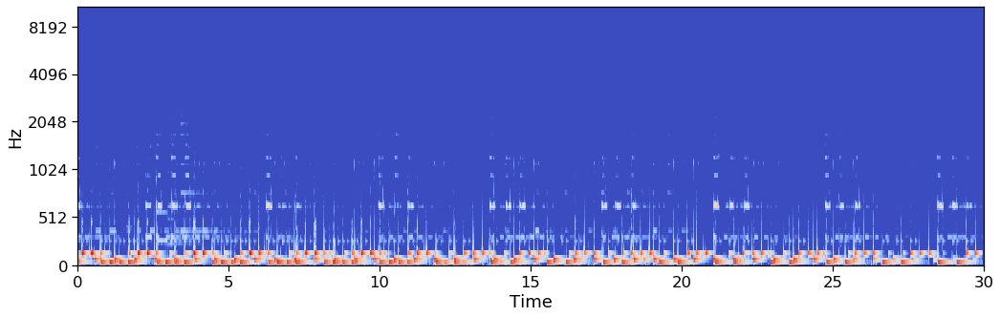

In [191]:
stft = np.abs(librosa.stft(x, n_fft=2048, hop_length=512))
mel = librosa.feature.melspectrogram(sr=sr, S=stft**2)
log_mel = librosa.amplitude_to_db(mel)
librosa.display.specshow(log_mel, sr=sr, hop_length=512, x_axis='time', y_axis='mel');